In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')


In [2]:
df=pd.read_csv('/content/air_quality_health_impact_data.csv')

In [3]:
df.head(10)

,RecordID,AQI,PM10,PM2_5,NO2,SO2,O3,Temperature,Humidity,WindSpeed,RespiratoryCases,CardiovascularCases,HospitalAdmissions,HealthImpactScore,HealthImpactClass
0,1,187.270059,295.853039,13.038560,6.639263,66.161150,54.624280,5.150335,84.424344,6.137755,7,5,1,97.244041,0.0
1,2,475.357153,246.254703,9.984497,16.318326,90.499523,169.621728,1.543378,46.851415,4.521422,10,2,0,100.000000,0.0
2,3,365.996971,84.443191,23.111340,96.317811,17.875850,9.006794,1.169483,17.806977,11.157384,13,3,0,100.000000,0.0
3,4,299.329242,21.020609,14.273403,81.234403,48.323616,93.161033,21.925276,99.473373,15.302500,8,8,1,100.000000,0.0
4,5,78.009320,16.987667,152.111623,121.235461,90.866167,241.795138,9.217517,24.906837,14.534733,9,0,1,95.182643,0.0
5,6,77.997260,36.113445,97.113240,87.769562,32.261206,136.999714,-1.441781,32.635904,4.675127,13,5,2,70.361491,1.0
6,7,29.041806,174.230575,68.578418,186.815370,96.766420,44.982397,34.378592,24.679305,6.610047,10,2,2,65.819949,1.0
7,8,433.088073,278.629026,83.673782,106.947943,9.707749,131.566014,33.707434,40.373157,17.376644,11,8,1,100.000000,0.0
8,9,300.557506,149.023028,185.789347,138.745212,90.267117,59.409878,33.123146,36.035212,14.464875,8,6,4,100.000000,0.0
9,10,354.036289,252.883645,182.150363,179.297055,44.521212,117.957437,9.537247,64.099202,14.253878,13,5,1,100.000000,0.0


In [4]:
df.drop('RecordID',axis=1,inplace=True)

In [5]:
df.isnull().sum()

AQI                    0
PM10                   0
PM2_5                  0
NO2                    0
SO2                    0
O3                     0
Temperature            0
Humidity               0
WindSpeed              0
RespiratoryCases       0
CardiovascularCases    0
HospitalAdmissions     0
HealthImpactScore      0
HealthImpactClass      0
dtype: int64

In [6]:
df.duplicated().sum()

0

In [8]:
df.shape

(5811, 14)

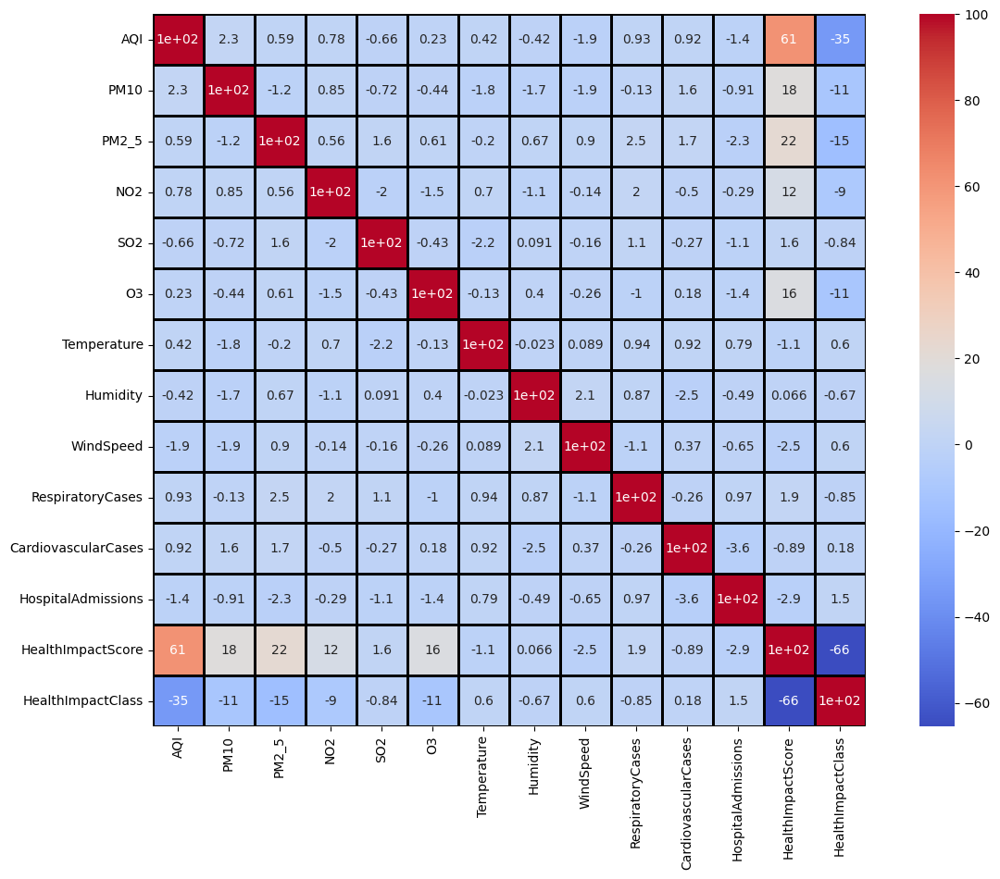

In [13]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr()*100,annot=True,cmap='coolwarm',linewidths=.85,linecolor='black',square=True)
plt.show()

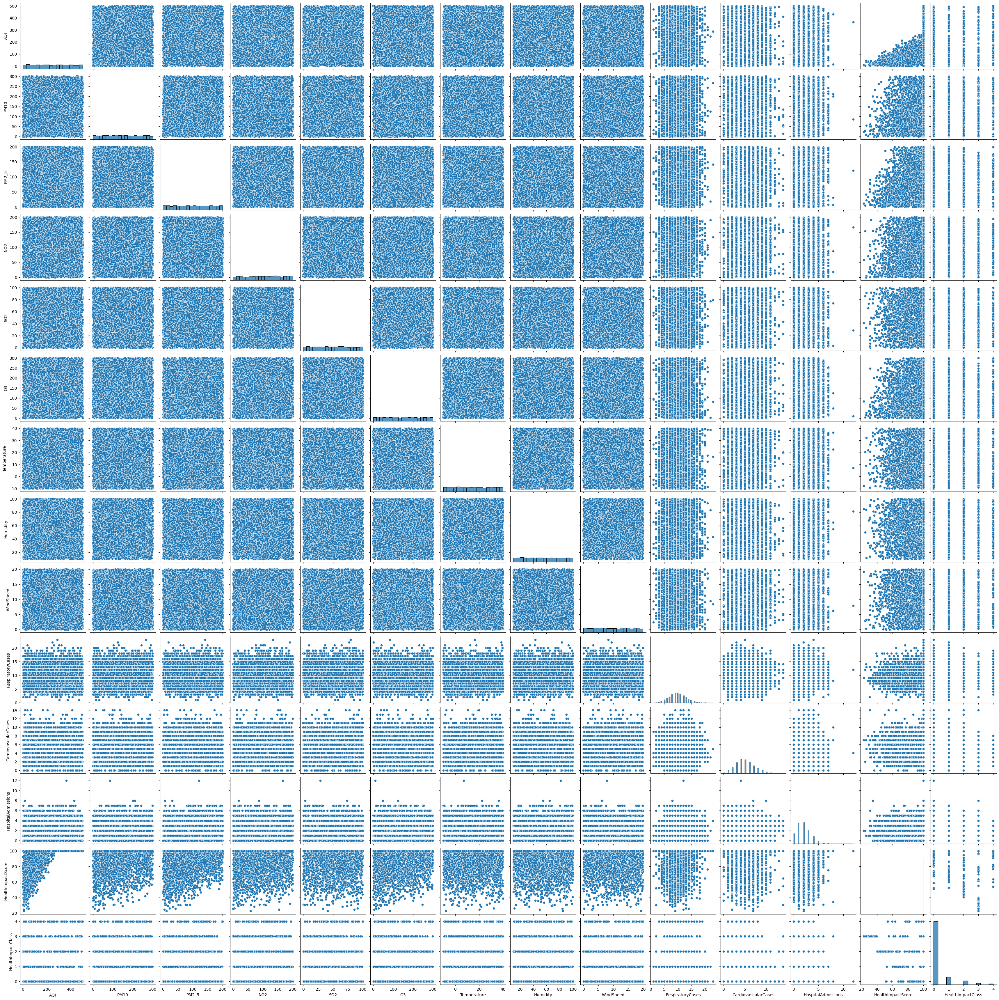

In [14]:
sns.pairplot(df)
plt.show()

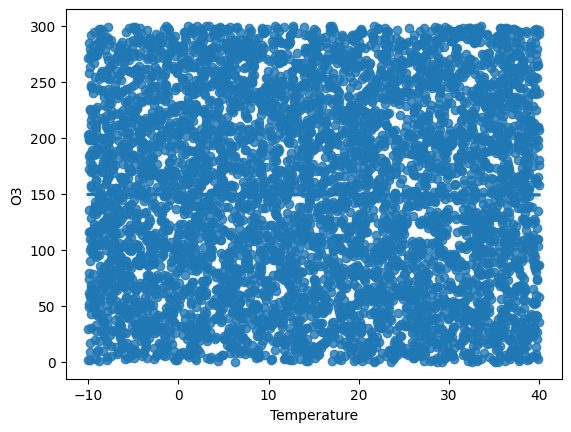

In [19]:
sns.regplot(x='Temperature',y='O3',data=df)
plt.show()

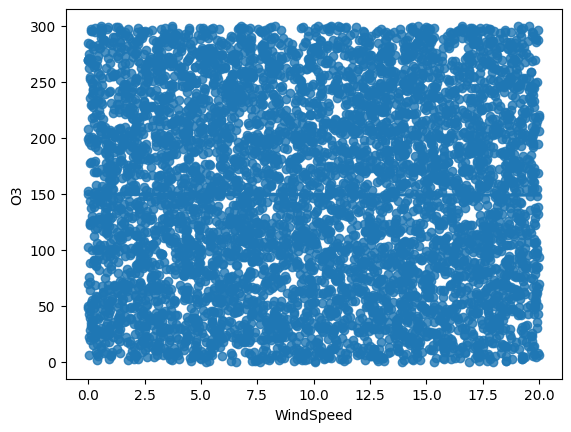

In [20]:
sns.regplot(x='WindSpeed',y='O3',data=df)
plt.show()

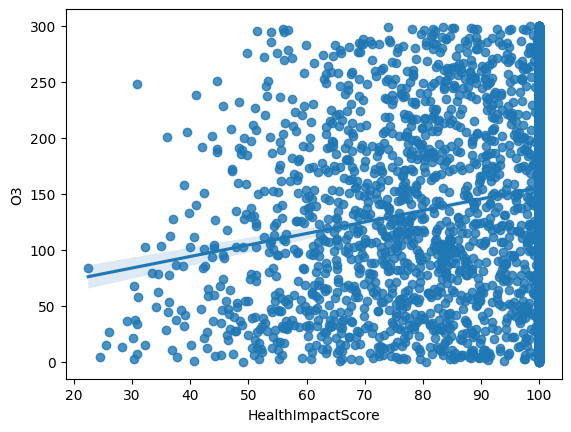

In [21]:
sns.regplot(x='HealthImpactScore',y='O3',data=df)
plt.show()

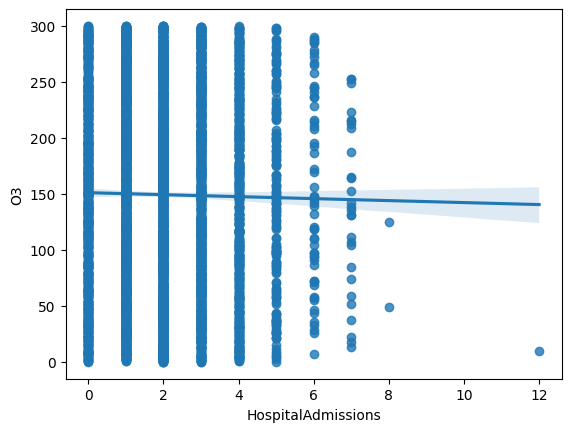

In [22]:
sns.regplot(x='HospitalAdmissions',y='O3',data=df)
plt.show()

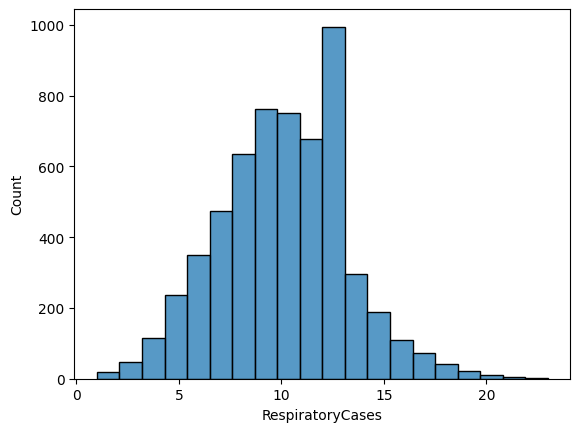

In [24]:
sns.histplot(x='RespiratoryCases',data=df,bins=20)
plt.show()

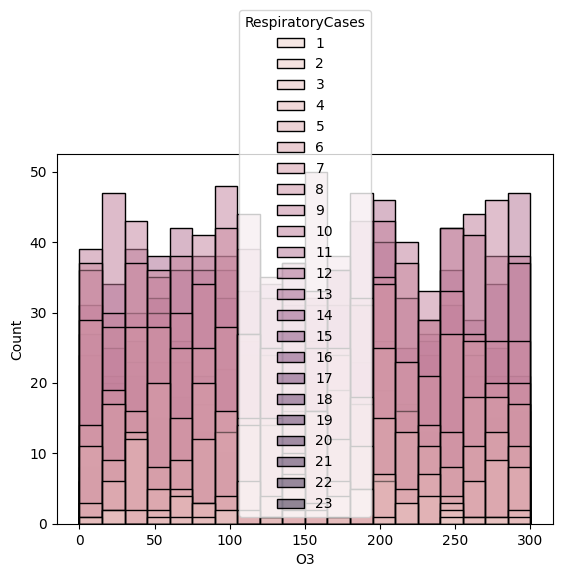

In [26]:
sns.histplot(x='O3',data=df,bins=20,hue='RespiratoryCases')
plt.show()

In [28]:
from sklearn.model_selection import train_test_split

In [29]:
X=df.drop('HealthImpactScore',axis=1)
y=df['HealthImpactScore']

In [62]:
X=X[['WindSpeed','Humidity','NO2','O3','PM10','PM2_5','AQI','HealthImpactClass']]

In [63]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.25,random_state=30)

In [64]:
from sklearn.preprocessing import StandardScaler
Scaler=StandardScaler()
X_train=Scaler.fit_transform(X_train)
X_test=Scaler.fit_transform(X_test)

In [75]:
from sklearn.linear_model import ElasticNet
elastic = ElasticNet()
elastic.fit(X_train,y_train)

ElasticNet()

In [76]:
y_pred3 = elastic.predict(X_test)

In [77]:
mean_squared_error(y_test, y_pred3)

72.47782755531341

In [78]:
r2_score(y_test, y_pred3)

0.5771717329758617

In [79]:
param = {
    'alpha': [0.1,0.3,0.5,0.7,0.9,1.0],
    'l1_ratio': [0.1,0.3,0.5,0.7,0.9,1.0]
}

In [81]:
from sklearn.model_selection import GridSearchCV
grid_search = GridSearchCV(elastic, param, cv=5,n_jobs=-1,scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=ElasticNet(), n_jobs=-1,
             param_grid={'alpha': [0.1, 0.3, 0.5, 0.7, 0.9, 1.0],
                         'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9, 1.0]},
             scoring='neg_mean_squared_error')

In [83]:
y_pred4 = grid_search.predict(X_test)

In [84]:
mean_squared_error(y_test, y_pred4)

61.737167402786426

In [85]:
r2_score(y_test, y_pred4)

0.639831650804142

In [88]:
print('Mean Squared Error:', mean_squared_error(y_test, y_pred4))
print('R-squared:', r2_score(y_test, y_pred4))

Mean Squared Error: 61.737167402786426
R-squared: 0.639831650804142


In [57]:
from sklearn.ensemble import ExtraTreesRegressor
import matplotlib.pyplot as plt

# Assuming X and Y are already defined as your features and target variables respectively
model = ExtraTreesRegressor()
model.fit(X, y)


ExtraTreesRegressor()

<Axes: >

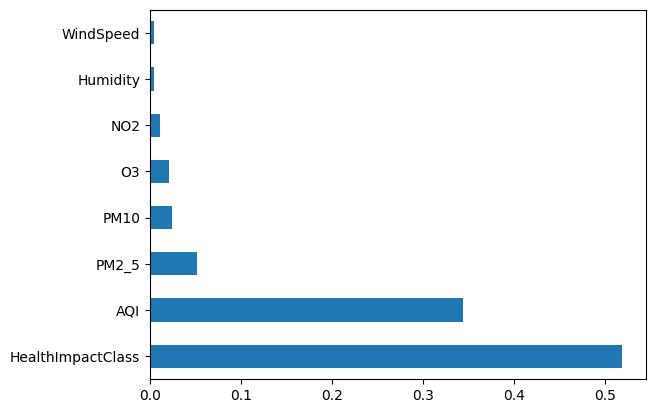

In [60]:
rank=pd.Series(model.feature_importances_,index=X.columns)
rank.nlargest(8).plot(kind='barh')

In [61]:
X.columns

Index(['AQI', 'PM10', 'PM2_5', 'NO2', 'SO2', 'O3', 'Temperature', 'Humidity',
       'WindSpeed', 'RespiratoryCases', 'CardiovascularCases',
       'HospitalAdmissions', 'HealthImpactClass'],
      dtype='object')

In [ ]:
X=X[['WindSpeed','Humidity','NO2','O3','PM10','PM2_5','AQI','HealthImpactClass']]

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5811 entries, 0 to 5810
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   AQI                  5811 non-null   float64
 1   PM10                 5811 non-null   float64
 2   PM2_5                5811 non-null   float64
 3   NO2                  5811 non-null   float64
 4   SO2                  5811 non-null   float64
 5   O3                   5811 non-null   float64
 6   Temperature          5811 non-null   float64
 7   Humidity             5811 non-null   float64
 8   WindSpeed            5811 non-null   float64
 9   RespiratoryCases     5811 non-null   int64  
 10  CardiovascularCases  5811 non-null   int64  
 11  HospitalAdmissions   5811 non-null   int64  
 12  HealthImpactScore    5811 non-null   float64
 13  HealthImpactClass    5811 non-null   float64
dtypes: float64(11), int64(3)
memory usage: 635.7 KB
